# **Digital Image Enhancement, Restoration and Object Segmentation Using the Oxford-IIIT Pet Dataset**

**Project Description**

This project focuses on enhancing, restoring, and segmenting pet images using the Oxford-IIIT Pet Dataset. Image enhancement techniques are applied to improve image quality, while Gaussian and salt-and-pepper noise are added and removed using filtering techniques. Otsu thresholding and edge detection are used for segmentation, followed by morphological operations to improve the segmented result. The results are compared using visual analysis and suitable evaluation measures.

**Import Required Libraries**

Import the libraries required for dataset handling, image processing, filtering, visualization, and evaluation.

In [ ]:
# Import required libraries
import numpy as np
import matplotlib.pyplot as plt
import cv2
import pandas as pd

from torchvision.datasets import OxfordIIITPet

from scipy.signal import wiener

from skimage.metrics import (
    mean_squared_error,
    peak_signal_noise_ratio,
    structural_similarity
)

**Dataset Loading**

Load the Oxford-IIIT Pet Dataset with its segmentation annotations.

In [ ]:
dataset = OxfordIIITPet(
    root="/content/oxford_pet",
    split="trainval",
    target_types="segmentation",
    download=True
)

print("Dataset loaded successfully.")
print("Total images:", len(dataset))

100%|██████████| 792M/792M [00:20<00:00, 38.4MB/s]
100%|██████████| 19.2M/19.2M [00:01<00:00, 17.8MB/s]


Dataset loaded successfully.
Total images: 3680


**Dataset Information**

This section displays the shape of the selected image and its corresponding segmentation mask. It also shows the unique values present in the mask.

In [ ]:
# Select the first image and its mask from the dataset
image, mask = dataset[0]

# Convert image and mask into NumPy arrays
image_array = np.array(image)
mask_array = np.array(mask)

# Display image and mask information
print("Image shape:", image_array.shape)
print("Mask shape:", mask_array.shape)

print("Mask values:", np.unique(mask_array))

# Display the total number of available images
print("Total images available:", len(dataset))

# Select the number of images for the project
number_of_images = 50

print("Number of images selected:", number_of_images)

Image shape: (500, 394, 3)
Mask shape: (500, 394)
Mask values: [1 2 3]
Total images available: 3680
Number of images selected: 50


**Visualizing Sample Images**

A few sample images and their corresponding segmentation masks are displayed.

This helps to understand the appearance of the pet images and the ground-truth segmentation before applying image processing techniques.

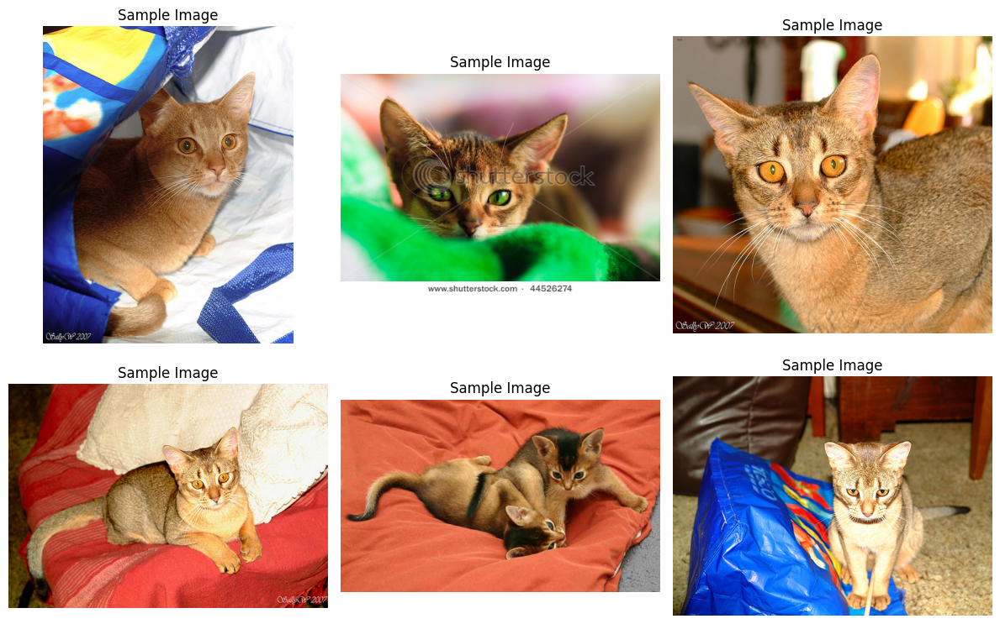

In [ ]:
plt.figure(figsize=(12, 8))

for i in range(6):

    image, mask = dataset[i]

    plt.subplot(2, 3, i + 1)

    plt.imshow(image)

    plt.title("Sample Image")

    plt.axis("off")

plt.tight_layout()
plt.show()

**Preprocessing the Images**

The selected image is resized to a fixed resolution and converted from RGB to grayscale.
Resizing provides a common image size for processing. Grayscale conversion is useful for intensity-based enhancement, noise filtering, thresholding, and edge detection.

In [ ]:
# Select the first image
image, mask = dataset[0]

# Convert image to NumPy array
image_rgb = np.array(image)

# Resize the image
image_rgb = cv2.resize(
    image_rgb,
    (256, 256)
)

# Convert the mask to NumPy array
mask_array = np.array(mask)

# Resize the mask
mask_array = cv2.resize(
    mask_array,
    (256, 256),
    interpolation=cv2.INTER_NEAREST
)

# Convert RGB image to grayscale
gray_image = cv2.cvtColor(
    image_rgb,
    cv2.COLOR_RGB2GRAY
)

print("Processed image shape:", gray_image.shape)

Processed image shape: (256, 256)


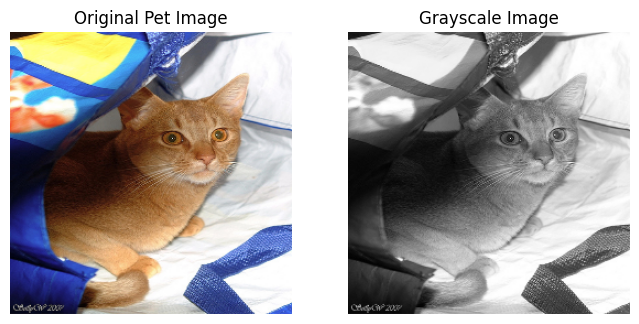

In [ ]:
# Display the preprocessed image
plt.figure(figsize=(8, 4))

plt.subplot(1, 2, 1)
plt.imshow(image_rgb)
plt.title("Original Pet Image")
plt.axis("off")

plt.subplot(1, 2, 2)
plt.imshow(gray_image, cmap="gray")
plt.title("Grayscale Image")
plt.axis("off")

plt.show()

**Image Enhancement**

**Gamma Transformation**

Gamma transformation is applied to modify the brightness of the grayscale image. A gamma value of 1.5 is used in this project.

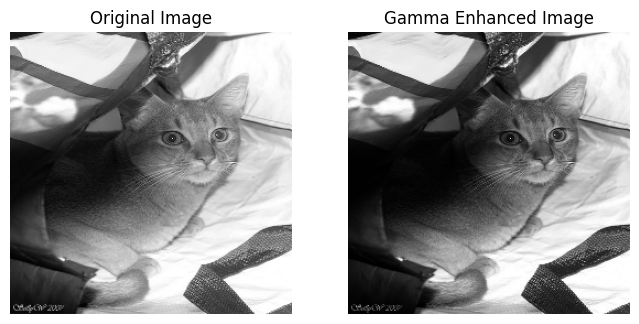

In [ ]:
# Apply Gamma Transformation
gamma = 1.5

normalized_image = gray_image / 255.0

gamma_image = np.power(
    normalized_image,
    gamma
)

gamma_image = np.uint8(
    gamma_image * 255
)

# Display the result
plt.figure(figsize=(8, 4))

plt.subplot(1, 2, 1)
plt.imshow(gray_image, cmap="gray")
plt.title("Original Image")
plt.axis("off")

plt.subplot(1, 2, 2)
plt.imshow(gamma_image, cmap="gray")
plt.title("Gamma Enhanced Image")
plt.axis("off")

plt.show()

**Contrast Stretching**

Contrast stretching expands the intensity range of the image. This can improve the visibility of details when the original image has a limited intensity range.

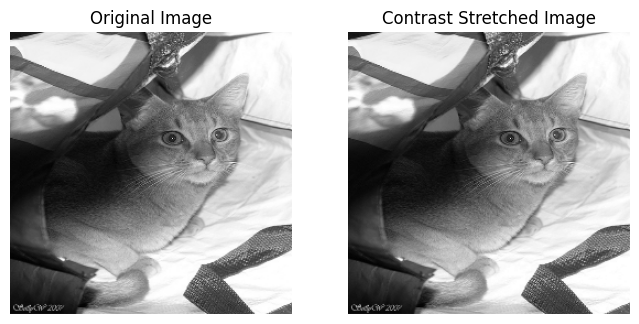

In [ ]:
# Apply Contrast Stretching
minimum = np.min(gray_image)
maximum = np.max(gray_image)

contrast_image = (
    (gray_image - minimum) /
    (maximum - minimum) * 255
).astype(np.uint8)

# Display the result
plt.figure(figsize=(8, 4))

plt.subplot(1, 2, 1)
plt.imshow(gray_image, cmap="gray")
plt.title("Original Image")
plt.axis("off")

plt.subplot(1, 2, 2)
plt.imshow(contrast_image, cmap="gray")
plt.title("Contrast Stretched Image")
plt.axis("off")

plt.show()

**Histogram Equalization**

Histogram equalization is used to improve image contrast by redistributing the intensity values. The original and equalized images are displayed along with their histograms.

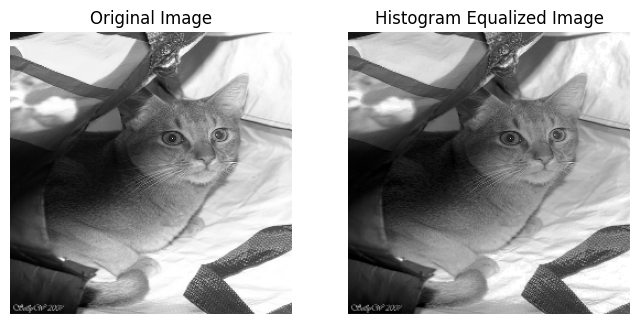

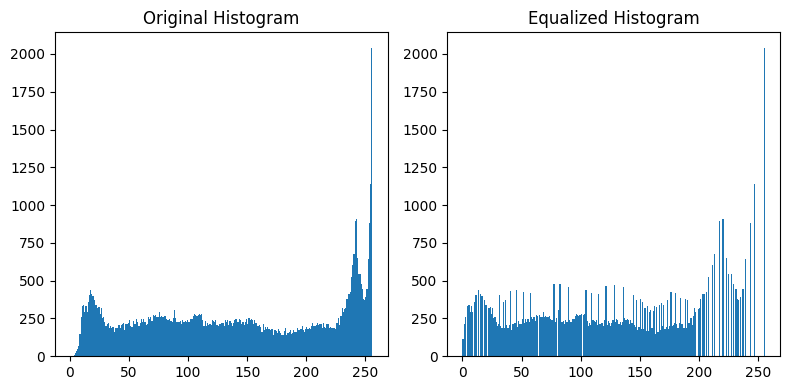

In [ ]:
# Apply Histogram Equalization
equalized_image = cv2.equalizeHist(
    gray_image
)

# Display the result
plt.figure(figsize=(8, 4))

plt.subplot(1, 2, 1)
plt.imshow(gray_image, cmap="gray")
plt.title("Original Image")
plt.axis("off")

plt.subplot(1, 2, 2)
plt.imshow(equalized_image, cmap="gray")
plt.title("Histogram Equalized Image")
plt.axis("off")

plt.show()

# Display the original and equalized histograms
plt.figure(figsize=(8, 4))

plt.subplot(1, 2, 1)
plt.hist(
    gray_image.ravel(),
    bins=256,
    range=(0, 256)
)
plt.title("Original Histogram")

plt.subplot(1, 2, 2)
plt.hist(
    equalized_image.ravel(),
    bins=256,
    range=(0, 256)
)
plt.title("Equalized Histogram")

plt.tight_layout()
plt.show()

**Gaussian Noise Addition**

Gaussian noise is added to the grayscale image using a mean of 0 and standard deviation of 25. The resulting image is clipped to the valid intensity range of 0–255.

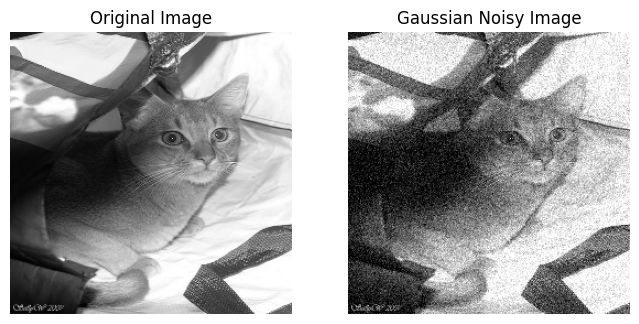

In [ ]:
# Generate Gaussian noise
mean = 0
sigma = 25

gaussian_noise = np.random.normal(
    mean,
    sigma,
    gray_image.shape
)

# Add Gaussian noise
gaussian_image = (
    gray_image.astype(np.float32)
    + gaussian_noise
)

# Keep values between 0 and 255
gaussian_image = np.clip(
    gaussian_image,
    0,
    255
).astype(np.uint8)

# Display Gaussian noisy image
plt.figure(figsize=(8, 4))

plt.subplot(1, 2, 1)
plt.imshow(gray_image, cmap="gray")
plt.title("Original Image")
plt.axis("off")

plt.subplot(1, 2, 2)
plt.imshow(gaussian_image, cmap="gray")
plt.title("Gaussian Noisy Image")
plt.axis("off")

plt.show()

**Salt-and-Pepper Noise Addition**

Salt-and-pepper noise introduces randomly distributed white and black pixels into the image. This type of noise is useful for testing median filtering.

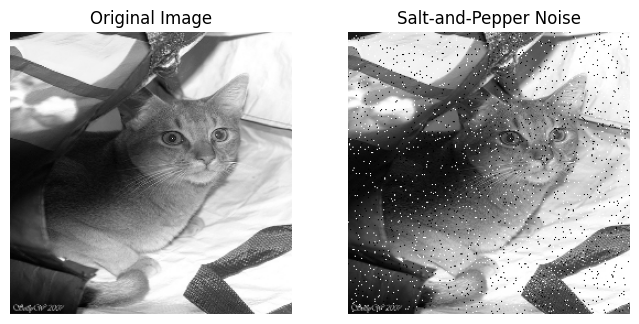

In [ ]:
# Create a copy of the original image
salt_pepper_image = gray_image.copy()

# Generate random values
random_values = np.random.rand(
    gray_image.shape[0],
    gray_image.shape[1]
)

# Add salt noise
salt_pepper_image[
    random_values < 0.02
] = 255

# Add pepper noise
salt_pepper_image[
    random_values > 0.98
] = 0

# Display salt-and-pepper noisy image
plt.figure(figsize=(8, 4))

plt.subplot(1, 2, 1)
plt.imshow(gray_image, cmap="gray")
plt.title("Original Image")
plt.axis("off")

plt.subplot(1, 2, 2)
plt.imshow(salt_pepper_image, cmap="gray")
plt.title("Salt-and-Pepper Noise")
plt.axis("off")

plt.show()

**Mean Filtering**

Mean filtering is applied to the Gaussian noisy image using a 5 × 5 filter. It reduces noise by replacing each pixel with the average of its neighboring pixels.

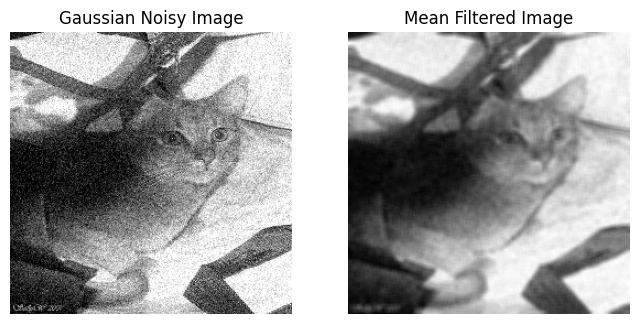

In [ ]:
# Apply Mean Filtering
mean_filtered = cv2.blur(
    gaussian_image,
    (5, 5)
)

# Display the result
plt.figure(figsize=(8, 4))

plt.subplot(1, 2, 1)
plt.imshow(gaussian_image, cmap="gray")
plt.title("Gaussian Noisy Image")
plt.axis("off")

plt.subplot(1, 2, 2)
plt.imshow(mean_filtered, cmap="gray")
plt.title("Mean Filtered Image")
plt.axis("off")

plt.show()

**Median Filtering**

Median filtering is applied to the salt-and-pepper noisy image using a 5 × 5 filter. It is useful for reducing impulse noise while preserving image edges.

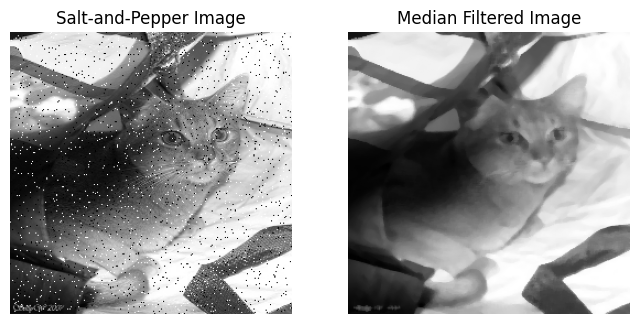

In [ ]:
# Apply Median Filtering
median_filtered = cv2.medianBlur(
    salt_pepper_image,
    5
)

# Display the result
plt.figure(figsize=(8, 4))

plt.subplot(1, 2, 1)
plt.imshow(salt_pepper_image, cmap="gray")
plt.title("Salt-and-Pepper Image")
plt.axis("off")

plt.subplot(1, 2, 2)
plt.imshow(median_filtered, cmap="gray")
plt.title("Median Filtered Image")
plt.axis("off")

plt.show()

**Wiener Filtering**

Wiener filtering is applied to the Gaussian noisy image using a 5 × 5 neighborhood. The result is converted back to an 8-bit image for display and evaluation.

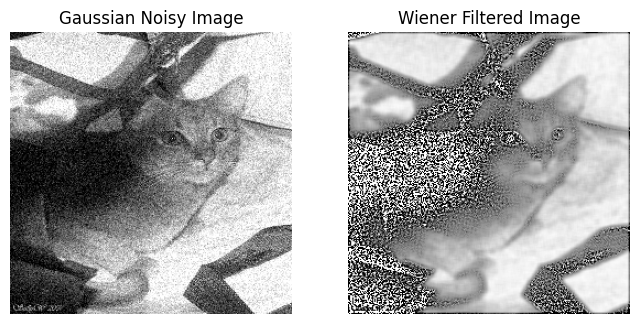

In [ ]:
# Apply Wiener Filtering
wiener_filtered = wiener(
    gaussian_image,
    (5, 5)
)

# Convert result to uint8
wiener_filtered = np.clip(
    wiener_filtered,
    0,
    255
).astype(np.uint8)

# Display the result
plt.figure(figsize=(8, 4))

plt.subplot(1, 2, 1)
plt.imshow(gaussian_image, cmap="gray")
plt.title("Gaussian Noisy Image")
plt.axis("off")

plt.subplot(1, 2, 2)
plt.imshow(wiener_filtered, cmap="gray")
plt.title("Wiener Filtered Image")
plt.axis("off")

plt.show()

**Restoration Results**

The original image, noisy images, and restored images are displayed together to compare the performance of the restoration techniques.

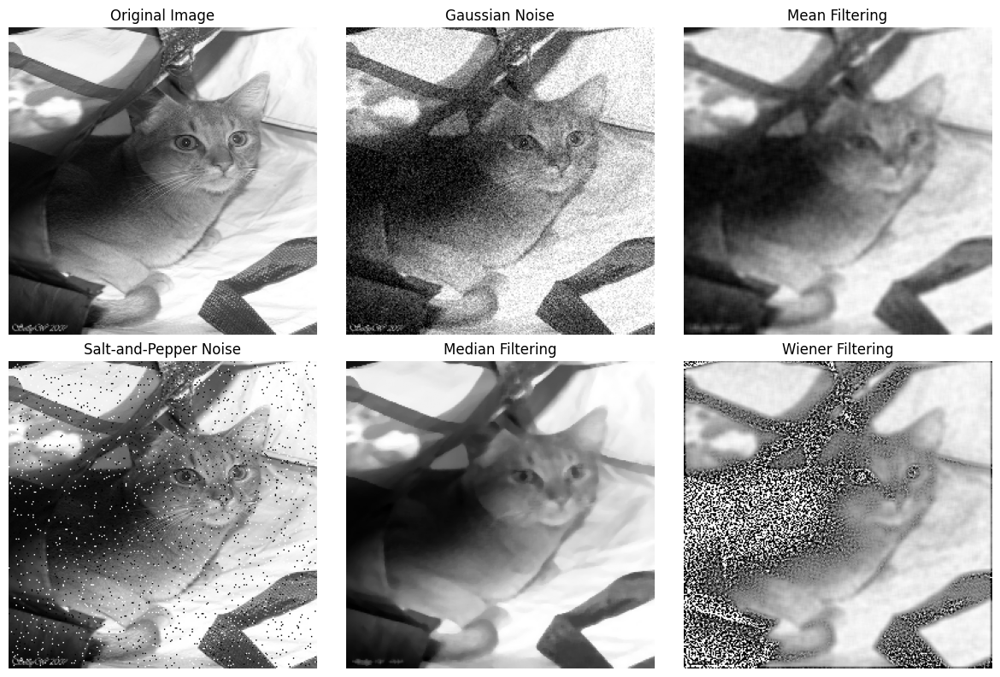

In [ ]:
# Display restoration results
plt.figure(figsize=(12, 8))

plt.subplot(2, 3, 1)
plt.imshow(gray_image, cmap="gray")
plt.title("Original Image")
plt.axis("off")

plt.subplot(2, 3, 2)
plt.imshow(gaussian_image, cmap="gray")
plt.title("Gaussian Noise")
plt.axis("off")

plt.subplot(2, 3, 3)
plt.imshow(mean_filtered, cmap="gray")
plt.title("Mean Filtering")
plt.axis("off")

plt.subplot(2, 3, 4)
plt.imshow(salt_pepper_image, cmap="gray")
plt.title("Salt-and-Pepper Noise")
plt.axis("off")

plt.subplot(2, 3, 5)
plt.imshow(median_filtered, cmap="gray")
plt.title("Median Filtering")
plt.axis("off")

plt.subplot(2, 3, 6)
plt.imshow(wiener_filtered, cmap="gray")
plt.title("Wiener Filtering")
plt.axis("off")

plt.tight_layout()
plt.show()

**Sobel Edge Detection**

Sobel edge detection is used to identify intensity changes in the horizontal and vertical directions. The two gradients are combined to obtain the edge magnitude.

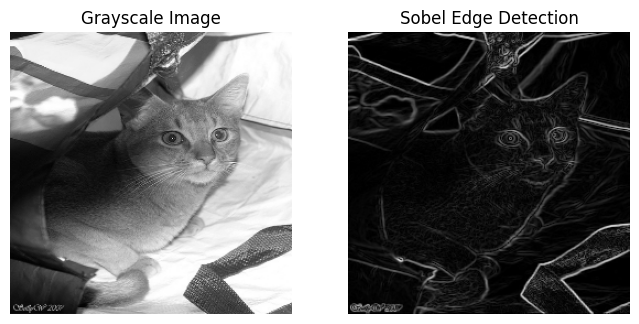

In [ ]:
# Apply Sobel X filter
sobel_x = cv2.Sobel(
    gray_image,
    cv2.CV_64F,
    1,
    0,
    ksize=3
)

# Apply Sobel Y filter
sobel_y = cv2.Sobel(
    gray_image,
    cv2.CV_64F,
    0,
    1,
    ksize=3
)

# Calculate edge magnitude
sobel_edges = cv2.magnitude(
    sobel_x.astype(np.float32),
    sobel_y.astype(np.float32)
)

# Normalize the result
sobel_edges = cv2.normalize(
    sobel_edges,
    None,
    0,
    255,
    cv2.NORM_MINMAX
).astype(np.uint8)

# Display Sobel result
plt.figure(figsize=(8, 4))

plt.subplot(1, 2, 1)
plt.imshow(gray_image, cmap="gray")
plt.title("Grayscale Image")
plt.axis("off")

plt.subplot(1, 2, 2)
plt.imshow(sobel_edges, cmap="gray")
plt.title("Sobel Edge Detection")
plt.axis("off")

plt.show()

**Canny Edge Detection**

Canny edge detection is used to detect strong boundaries in the image. Lower and upper threshold values of 50 and 150 are used.

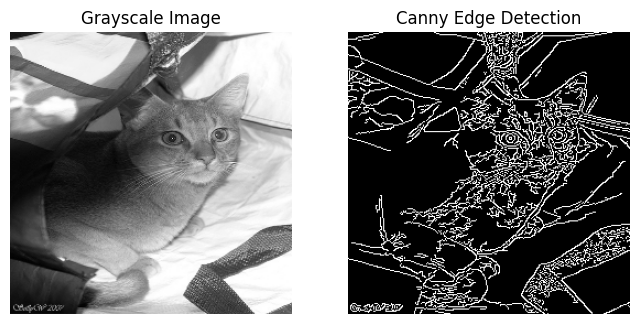

In [ ]:
# Apply Canny Edge Detection
canny_edges = cv2.Canny(
    gray_image,
    50,
    150
)

# Display Canny result
plt.figure(figsize=(8, 4))

plt.subplot(1, 2, 1)
plt.imshow(gray_image, cmap="gray")
plt.title("Grayscale Image")
plt.axis("off")

plt.subplot(1, 2, 2)
plt.imshow(canny_edges, cmap="gray")
plt.title("Canny Edge Detection")
plt.axis("off")

plt.show()

**Otsu Thresholding**

Otsu thresholding automatically determines a threshold value from the image histogram and creates a binary segmentation mask.

Otsu threshold value: 143.0


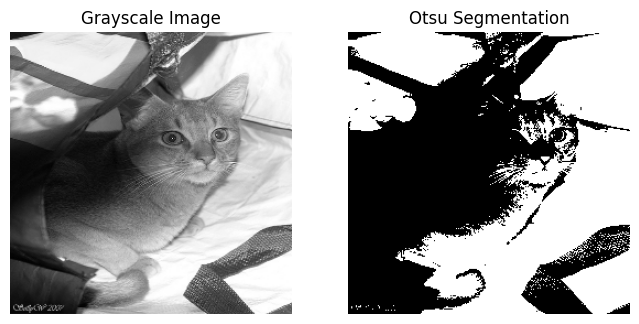

In [ ]:
# Apply Otsu Thresholding
otsu_value, otsu_mask = cv2.threshold(
    gray_image,
    0,
    255,
    cv2.THRESH_BINARY + cv2.THRESH_OTSU
)

print("Otsu threshold value:", otsu_value)

# Display Otsu segmentation
plt.figure(figsize=(8, 4))

plt.subplot(1, 2, 1)
plt.imshow(gray_image, cmap="gray")
plt.title("Grayscale Image")
plt.axis("off")

plt.subplot(1, 2, 2)
plt.imshow(otsu_mask, cmap="gray")
plt.title("Otsu Segmentation")
plt.axis("off")

plt.show()

**Morphological Operations**

Morphological operations are applied to the Otsu segmentation mask using a 3 × 3 elliptical structuring element. Erosion, dilation, opening, and closing are used to study different forms of morphological processing.

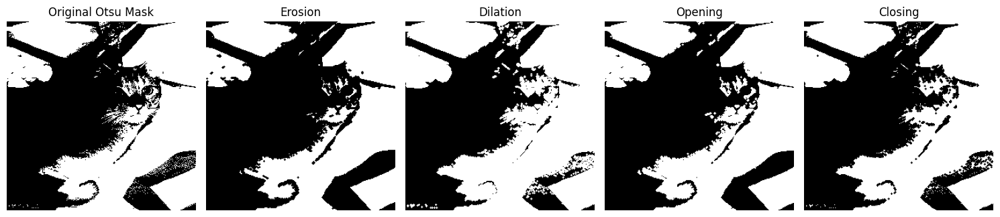

In [ ]:
# Create a 3 × 3 elliptical structuring element
kernel = cv2.getStructuringElement(
    cv2.MORPH_ELLIPSE,
    (3, 3)
)

# Apply Erosion
eroded_image = cv2.erode(
    otsu_mask,
    kernel,
    iterations=1
)

# Apply Dilation
dilated_image = cv2.dilate(
    otsu_mask,
    kernel,
    iterations=1
)

# Apply Opening
opened_image = cv2.morphologyEx(
    otsu_mask,
    cv2.MORPH_OPEN,
    kernel
)

# Apply Closing
closed_image = cv2.morphologyEx(
    otsu_mask,
    cv2.MORPH_CLOSE,
    kernel
)

# Display the results
plt.figure(figsize=(15, 4))

plt.subplot(1, 5, 1)
plt.imshow(otsu_mask, cmap="gray")
plt.title("Original Otsu Mask")
plt.axis("off")

plt.subplot(1, 5, 2)
plt.imshow(eroded_image, cmap="gray")
plt.title("Erosion")
plt.axis("off")

plt.subplot(1, 5, 3)
plt.imshow(dilated_image, cmap="gray")
plt.title("Dilation")
plt.axis("off")

plt.subplot(1, 5, 4)
plt.imshow(opened_image, cmap="gray")
plt.title("Opening")
plt.axis("off")

plt.subplot(1, 5, 5)
plt.imshow(closed_image, cmap="gray")
plt.title("Closing")
plt.axis("off")

plt.tight_layout()
plt.show()

**Ground Truth Comparison**

The dataset mask is converted into a binary mask where the pet region is represented by white pixels. The final segmentation result is compared with the ground-truth mask.

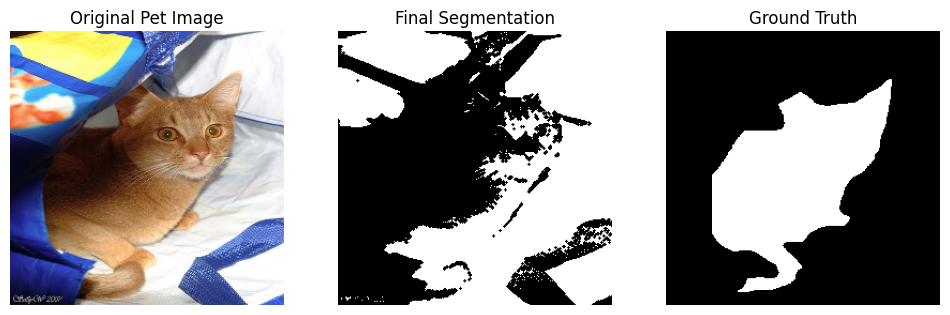

In [ ]:
# Create binary ground-truth mask
ground_truth = np.where(
    mask_array == 1,
    255,
    0
).astype(np.uint8)

# Display comparison
plt.figure(figsize=(12, 4))

plt.subplot(1, 3, 1)
plt.imshow(image_rgb)
plt.title("Original Pet Image")
plt.axis("off")

plt.subplot(1, 3, 2)
plt.imshow(closed_image, cmap="gray")
plt.title("Final Segmentation")
plt.axis("off")

plt.subplot(1, 3, 3)
plt.imshow(ground_truth, cmap="gray")
plt.title("Ground Truth")
plt.axis("off")

plt.show()

**Restoration Evaluation**

The restoration techniques are quantitatively evaluated using MSE, PSNR, and SSIM. These measures compare each restored image with the original noise-free grayscale image.

In [ ]:
# Calculate Mean Filtering metrics
mse_mean = mean_squared_error(
    gray_image,
    mean_filtered
)

psnr_mean = peak_signal_noise_ratio(
    gray_image,
    mean_filtered,
    data_range=255
)

ssim_mean = structural_similarity(
    gray_image,
    mean_filtered,
    data_range=255
)

print("Mean Filtering")
print("MSE :", mse_mean)
print("PSNR:", psnr_mean)
print("SSIM:", ssim_mean)

# Calculate Median Filtering metrics
mse_median = mean_squared_error(
    gray_image,
    median_filtered
)

psnr_median = peak_signal_noise_ratio(
    gray_image,
    median_filtered,
    data_range=255
)

ssim_median = structural_similarity(
    gray_image,
    median_filtered,
    data_range=255
)

print("Median Filtering")
print("MSE :", mse_median)
print("PSNR:", psnr_median)
print("SSIM:", ssim_median)

# Calculate Wiener Filtering metrics
mse_wiener = mean_squared_error(
    gray_image,
    wiener_filtered
)

psnr_wiener = peak_signal_noise_ratio(
    gray_image,
    wiener_filtered,
    data_range=255
)

ssim_wiener = structural_similarity(
    gray_image,
    wiener_filtered,
    data_range=255
)

print("Wiener Filtering")
print("MSE :", mse_wiener)
print("PSNR:", psnr_wiener)
print("SSIM:", ssim_wiener)

Mean Filtering
MSE : 204.16783142089844
PSNR: 25.030930449433647
SSIM: 0.7169416036803673
Median Filtering
MSE : 117.0440673828125
PSNR: 27.447309553786617
SSIM: 0.8217245018444234
Wiener Filtering
MSE : 6218.71435546875
PSNR: 10.193797520673716
SSIM: 0.3546072507941955


**Segmentation Evaluation**

The final segmentation is compared with the ground-truth mask using IoU and Dice Score. These metrics measure the overlap between the predicted pet region and the actual pet region.

In [ ]:
# Convert masks to Boolean values
predicted_mask = closed_image > 0
true_mask = ground_truth > 0

# Calculate intersection
intersection = np.logical_and(
    predicted_mask,
    true_mask
).sum()

# Calculate union
union = np.logical_or(
    predicted_mask,
    true_mask
).sum()

# Calculate IoU
iou = intersection / union if union != 0 else 0

# Calculate Dice Score
dice = (
    2 * intersection /
    (predicted_mask.sum() + true_mask.sum())
)

print("Segmentation Evaluation")
print("-----------------------")
print("IoU Score :", iou)
print("Dice Score:", dice)

Segmentation Evaluation
-----------------------
IoU Score : 0.12476771967082559
Dice Score: 0.22185508614585792


**Multiple Image Testing**

The segmentation process is tested on several different images from the dataset. Otsu thresholding followed by opening and closing is applied to each image.

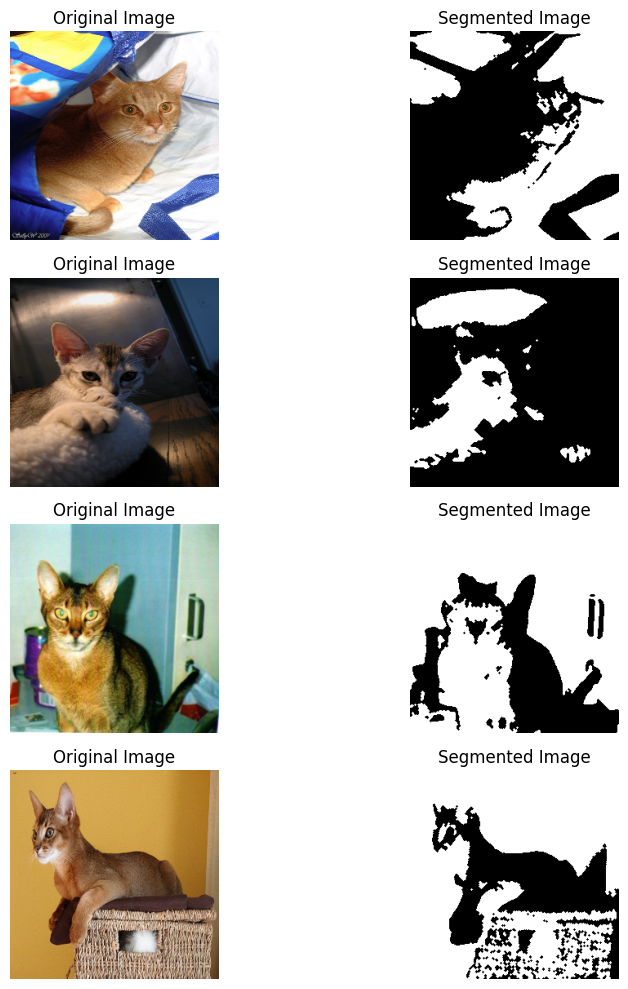

In [ ]:
# Select different images for testing
image_numbers = [0, 10, 20, 30]

# Display multiple segmentation results
plt.figure(figsize=(10, 10))

for position, number in enumerate(image_numbers):

    # Load image
    image, mask = dataset[number]

    # Convert image to NumPy array
    image_rgb = np.array(image)

    # Resize image
    image_rgb = cv2.resize(
        image_rgb,
        (256, 256)
    )

    # Convert to grayscale
    gray = cv2.cvtColor(
        image_rgb,
        cv2.COLOR_RGB2GRAY
    )

    # Apply Otsu thresholding
    _, segmented = cv2.threshold(
        gray,
        0,
        255,
        cv2.THRESH_BINARY + cv2.THRESH_OTSU
    )

    # Apply opening
    segmented = cv2.morphologyEx(
        segmented,
        cv2.MORPH_OPEN,
        kernel
    )

    # Apply closing
    segmented = cv2.morphologyEx(
        segmented,
        cv2.MORPH_CLOSE,
        kernel
    )

    # Display original image
    plt.subplot(4, 2, position * 2 + 1)
    plt.imshow(image_rgb)
    plt.title("Original Image")
    plt.axis("off")

    # Display segmented image
    plt.subplot(4, 2, position * 2 + 2)
    plt.imshow(segmented, cmap="gray")
    plt.title("Segmented Image")
    plt.axis("off")

plt.tight_layout()
plt.show()

**Restoration Results Table**

The MSE, PSNR, and SSIM values of the three restoration techniques are organized into a table for easier comparison.

,Method,MSE,PSNR (dB),SSIM
0,Mean Filtering,204.167831,25.030930,0.716942
1,Median Filtering,117.044067,27.447310,0.821725
2,Wiener Filtering,6218.714355,10.193798,0.354607


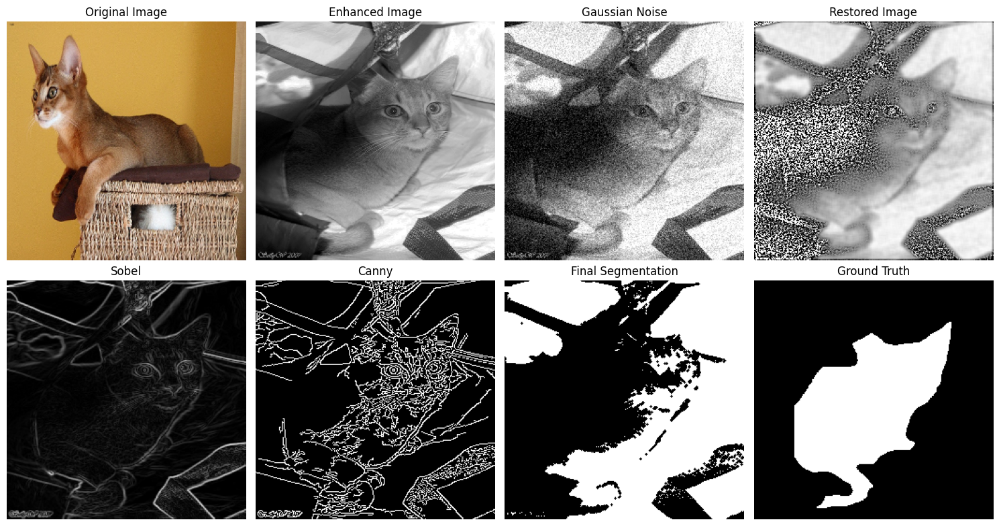

In [ ]:
# Create restoration results table
results = {
    "Method": [
        "Mean Filtering",
        "Median Filtering",
        "Wiener Filtering"
    ],
    "MSE": [
        mse_mean,
        mse_median,
        mse_wiener
    ],
    "PSNR (dB)": [
        psnr_mean,
        psnr_median,
        psnr_wiener
    ],
    "SSIM": [
        ssim_mean,
        ssim_median,
        ssim_wiener
    ]
}

results_df = pd.DataFrame(results)

display(results_df)



# Display final project results
plt.figure(figsize=(15, 8))

plt.subplot(2, 4, 1)
plt.imshow(image_rgb)
plt.title("Original Image")
plt.axis("off")

plt.subplot(2, 4, 2)
plt.imshow(equalized_image, cmap="gray")
plt.title("Enhanced Image")
plt.axis("off")

plt.subplot(2, 4, 3)
plt.imshow(gaussian_image, cmap="gray")
plt.title("Gaussian Noise")
plt.axis("off")

plt.subplot(2, 4, 4)
plt.imshow(wiener_filtered, cmap="gray")
plt.title("Restored Image")
plt.axis("off")

plt.subplot(2, 4, 5)
plt.imshow(sobel_edges, cmap="gray")
plt.title("Sobel")
plt.axis("off")

plt.subplot(2, 4, 6)
plt.imshow(canny_edges, cmap="gray")
plt.title("Canny")
plt.axis("off")

plt.subplot(2, 4, 7)
plt.imshow(closed_image, cmap="gray")
plt.title("Final Segmentation")
plt.axis("off")

plt.subplot(2, 4, 8)
plt.imshow(ground_truth, cmap="gray")
plt.title("Ground Truth")
plt.axis("off")

plt.tight_layout()
plt.show()

**Final Project Results**

The main results of the project are displayed together in one figure. This provides an overall view of enhancement, noise, restoration, edge detection, segmentation, and ground truth

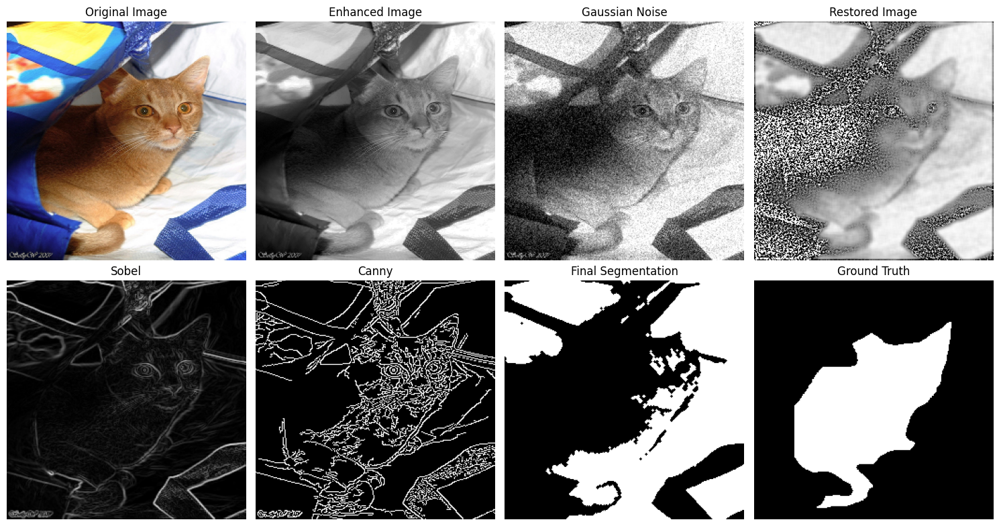

In [ ]:
# Display final project results

# Load the first image again
image, mask = dataset[0]

# Convert image to NumPy array
image_array = np.array(image)

# Resize image
original_image_rgb = cv2.resize(
    image_array,
    (256, 256)
)

# Display final project results
plt.figure(figsize=(15, 8))

plt.subplot(2, 4, 1)
plt.imshow(original_image_rgb)
plt.title("Original Image")
plt.axis("off")

plt.subplot(2, 4, 2)
plt.imshow(equalized_image, cmap="gray")
plt.title("Enhanced Image")
plt.axis("off")

plt.subplot(2, 4, 3)
plt.imshow(gaussian_image, cmap="gray")
plt.title("Gaussian Noise")
plt.axis("off")

plt.subplot(2, 4, 4)
plt.imshow(wiener_filtered, cmap="gray")
plt.title("Restored Image")
plt.axis("off")

plt.subplot(2, 4, 5)
plt.imshow(sobel_edges, cmap="gray")
plt.title("Sobel")
plt.axis("off")

plt.subplot(2, 4, 6)
plt.imshow(canny_edges, cmap="gray")
plt.title("Canny")
plt.axis("off")

plt.subplot(2, 4, 7)
plt.imshow(closed_image, cmap="gray")
plt.title("Final Segmentation")
plt.axis("off")

plt.subplot(2, 4, 8)
plt.imshow(ground_truth, cmap="gray")
plt.title("Ground Truth")
plt.axis("off")

plt.tight_layout()
plt.show()

 **Limitations**

The project has the following limitations:

Otsu thresholding may not work perfectly when the pet and background have similar intensity values.
Edge detection may produce incomplete boundaries in some images.
Restoration performance depends on the selected noise level and filter size.
Traditional image processing cannot recover details that are completely lost.
Only a selected number of images are used for detailed testing.

The project guidelines also identify parameter sensitivity, limited image types, and difficulties with low-contrast or highly degraded images as possible limitations.

**Future Scope**

The project can be improved in the future by:

Using a larger and more diverse image dataset.
Applying adaptive filtering techniques.
Using adaptive thresholding for difficult images.
Exploring watershed segmentation.
Applying deep learning-based image segmentation.
Developing a real-time image processing application.
Performing evaluation on a larger number of ground-truth images.

These improvements are consistent with the future-scope possibilities given in the project guidelines.

**Conclusion**

The project demonstrates image enhancement, noise addition, image restoration, edge detection, threshold-based segmentation, and morphological post-processing using the Oxford-IIIT Pet Dataset. Gamma transformation, contrast stretching, and histogram equalization improve image appearance, while mean, median, and Wiener filters reduce different types of noise. Sobel and Canny detect image boundaries, and Otsu thresholding with morphological operations produces a segmented image. MSE, PSNR, SSIM, IoU, Dice Score, and Accuracy are used to evaluate the results.